<a href="https://colab.research.google.com/github/tirsodelrey/22-23-1-PR-PR1-DED/blob/master/skin_cancer_classification_191223_2130.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install timm
import fastai
import pandas as pd
from fastai import *
from fastai.vision import *
from fastai.vision.all import *
from fastai.data.all import *

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 20.4 MB/s eta 0:00:00


In [ ]:
!pip install kaggle

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
path = '/content/drive/MyDrive/Colab Notebooks/TFG/HAM10000'

In [5]:
cd /content/drive/MyDrive/Colab Notebooks/TFG/HAM10000

/content/drive/MyDrive/Colab Notebooks/TFG/HAM10000


In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"tirsogumb","key":"5431d5a7692395bb93376b6ac6923b82"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!rm kaggle.json



In [ ]:
!kaggle datasets download -d kmader/skin-cancer-mnist-ham10000

100% 5.20G/5.20G [04:18<00:00, 23.2MB/s]
100% 5.20G/5.20G [04:18<00:00, 21.6MB/s]


#Exploración de los datos#

##Carga y procesamiento##

Descomprimimos el dataset descargado directamente de la fuente oficial de Kaggle a nuestro directorio de trabajo.

In [6]:
train_path = path +'/train_images'

In [ ]:
!unzip "/content/drive/MyDrive/Colab Notebooks/TFG/HAM10000/skin-cancer-mnist-ham10000.zip" -d train_path

unzip:  cannot find or open /content/drive/MyDrive/Colab Notebooks/TFG/HAM10000/skin-cancer-mnist-ham10000.zip, /content/drive/MyDrive/Colab Notebooks/TFG/HAM10000/skin-cancer-mnist-ham10000.zip.zip or /content/drive/MyDrive/Colab Notebooks/TFG/HAM10000/skin-cancer-mnist-ham10000.zip.ZIP.


Ahora que las imágenes se encuentran en el directorio de trabajo, obtenemos una lista de ellas.


In [7]:
files = get_image_files(train_path)

Y observamos una de ellas para hacernos una idea de la estructura general:

(600, 450)


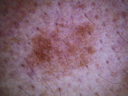

In [ ]:
img = PILImage.create(files[0])
print(img.size)
img.to_thumb(128)

Parece ser que las imágenes serán 600*450. Para asegurarnos. Comprobaremos todas las medidas de manera paralelizada utilizando la librería fastcore.parallel:

In [ ]:
from fastcore.parallel import *

def f(o): return PILImage.create(o).size
sizes = parallel(f, files, n_workers=8)
pd.Series(sizes).value_counts()

(600, 450)    10015
dtype: int64

Tenemos 10.015 imágenes, todas del mismo tamaño, esto es importante ya que si no la librería de fastai sería incapaz de crear *batches* y tendríamos que aplicar una transformación que iguale el tamaño de todas. Posteriormente también aplicaremos transformaciones

Ahora procedamos a hacer una exploración de los datos de estudio cargando los datos presentes en el csv HAM10000_metadata, que como su propio nombre indica, contine los metadatos, esto es, la información que describe el contenido de los datos.

In [8]:
df = pd.read_csv(path+'/HAM10000_metadata.csv')
df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


Observamos que los metadatos nos proporcionan información que relaciona los identificadores de las imágenes, que hemos descargado en train_images, con la información sobre la enfermedad como diagnóstico (dx) tipo de muestra (dx_type), edad, sexo o localización. No obstante, los códigos de los diagnósticos no son muy descriptivos, por lo que crearemos un diccionario que permita relacionar cada código con el tipo de lesión que referencia.

In [9]:
# Diccionario para mapear abreviaturas a nombres completos de lesiones
short_to_full_name_dict = {
    "akiec": "bowen's disease",
    "bcc": "basal cell carcinoma",
    "bkl": "benign keratosis-like lesions",
    "df": "dermatofibroma",
    "mel": "melanoma",
    "nv": "melanocytic nevi",
    "vasc": "vascular lesions",
}


In [10]:
# Reemplazar abreviaturas por nombres completos en la columna 'tipo_lesion'
df['lesion_type'] = df['dx'].map(short_to_full_name_dict)

In [10]:
df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,lesion_type
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,benign keratosis-like lesions
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,benign keratosis-like lesions
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,benign keratosis-like lesions
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,benign keratosis-like lesions
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,benign keratosis-like lesions


A continuación crearemos un diccionario que nos permita relacionar cada identificador de imagen con el tipo de lesión (tipo_lesión), que utilizaremos más adelante como etiqueta.

In [11]:
# Crear el diccionario que relaciona cada imagen con su enfermedad
id_disease_dict = dict(zip(df['image_id'], df['lesion_type']))

##Limpieza de los datos##

Buscamos si existen valores nulos:

In [12]:
df.isnull().sum()

lesion_id        0
image_id         0
dx               0
dx_type          0
age             57
sex              0
localization     0
lesion_type      0
dtype: int64

Solo el atributo edad tiene, valores nulos, que sustituiremos por la media

In [13]:
df['age'].fillna((df['age'].mean()), inplace=True)

In [14]:
# Definir una función para obtener las etiquetas (enfermedades) de las imágenes
def get_label(file_path):
    file_name = file_path.name
    image_id = file_name.split('.')[0]  # Obtener el ID de la imagen
    disease = id_disease_dict.get(image_id)  # Obtener la enfermedad asociada al ID
    return disease

##Análisis exploratorio##

In [ ]:
print(df.lesion_type.value_counts())

melanocytic nevi                 6705
melanoma                         1113
benign keratosis-like lesions    1099
basal cell carcinoma              514
bowen's disease                   327
vascular lesions                  142
dermatofibroma                    115
Name: lesion_type, dtype: int64


A continuación observamos un diagrama con representación del número de muestras en términos absolutos en función del tipo de lesión.

<Axes: >

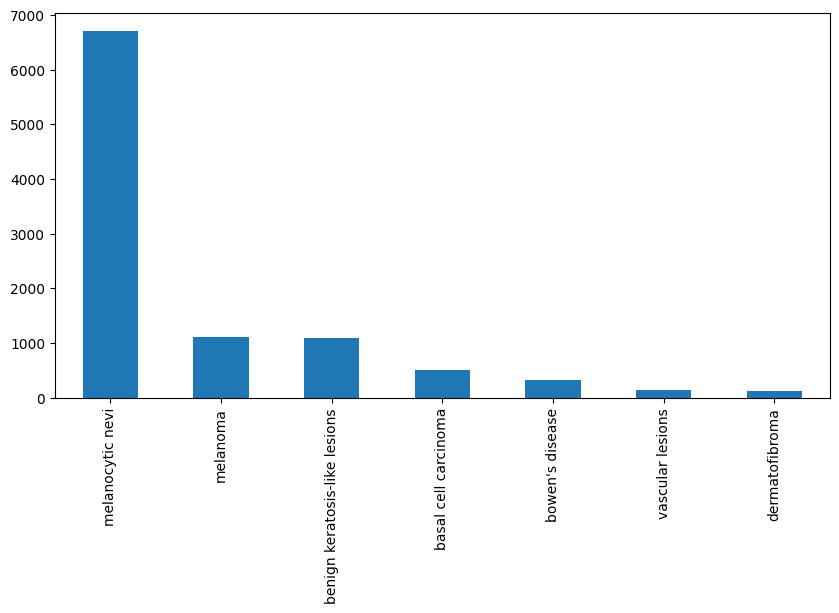

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize= (10, 5))
df['lesion_type'].value_counts().plot(kind='bar', ax=ax1)

Se trata de una dataset notablemente desequilibrado, con un gran número de muestras de nevo melanocítico, comunmente conocido como lunar, que aglutina más de la mitad de las muestras del dataset. Las siguientes muestras más frecuentes son el melanoma y la queratosis benigna.

Una vez explorado el dataset, pasamos al procesamiento de los datos. Para poder en un principio procesarlos de manera más rápida, utilizaremos algunas de las funciones de la API data block de fastai, que permite aglutinar diversas clases de PyTorch en una.




Definimos una función que permita extraer las etiquetas de las imágenes utilizando el diccionario creado anteriormente.

##Resultados

###Primer modelo

Definimos una estructura de Datablock de la API de fastai que nos permite definir:


*   El tipo de elemento de los bloques (Imagen y categoría)
*   La randomización del conjunto inicial en un conjunto de entrenamiento (80%) y validación (20%). Definimos un seed para garantizar la reproductibilidad.


*   Definimos la función que permite obtener las etiquetas de las imágenes.
*   Reescalamos las imágenes a 480*480 para el entrenamiento por lotes (batch_tfms) al que se aplicará además el aumento (aug_transforms) no se pierda información útil.





In [ ]:
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=get_label,
    item_tfms=Resize(450, method='squish'),
    batch_tfms=aug_transforms(size=128, min_scale=0.75)
  )

In [ ]:
dblock.summary(train_path)

Setting-up type transforms pipelines
Found 10015 items
2 datasets of sizes 8012,2003
Setting up Pipeline: PILBase.create
Setting up Pipeline: get_label -> Categorize -- {'vocab': None, 'sort': True, 'add_na': False}

Building one sample
  Pipeline: PILBase.create
    starting from
      /content/drive/MyDrive/Colab Notebooks/TFG/HAM10000/train_images/ham10000_images_part_2/ISIC_0032838.jpg
    applying PILBase.create gives
      PILImage mode=RGB size=600x450
  Pipeline: get_label -> Categorize -- {'vocab': None, 'sort': True, 'add_na': False}
    starting from
      /content/drive/MyDrive/Colab Notebooks/TFG/HAM10000/train_images/ham10000_images_part_2/ISIC_0032838.jpg
    applying get_label gives
      melanocytic nevi
    applying Categorize -- {'vocab': None, 'sort': True, 'add_na': False} gives
      TensorCategory(4)

Final sample: (PILImage mode=RGB size=600x450, TensorCategory(4))


Found 10015 items
2 datasets of sizes 8012,2003
Setting up Pipeline: PILBase.create
Setting up P

Si se inspecciona aug_transforms() se pueden observar algunas de las transformaciones aplicadas como Flip (voltear la imagen) o Brightness (iluminación)

In [ ]:
aug_transforms()

[Flip -- {'size': None, 'mode': 'bilinear', 'pad_mode': 'reflection', 'mode_mask': 'nearest', 'align_corners': True, 'p': 0.5}:
 encodes: (TensorImage,object) -> encodes
 (TensorMask,object) -> encodes
 (TensorBBox,object) -> encodes
 (TensorPoint,object) -> encodes
 decodes: ,
 Brightness -- {'max_lighting': 0.2, 'p': 1.0, 'draw': None, 'batch': False}:
 encodes: (TensorImage,object) -> encodes
 decodes: ]

Cargamos el DataBlock en un dataloader indicando el directorio donde se encuentran el conjunto de entrenamiento.

In [ ]:
dls = dblock.dataloaders(train_path)

fastai permite ver el conjunto de entrenamiento tras aplicar las transformaciones. Este es un ejemplo del funcionamiento de la técnica de aumento, que genera varias copias transformadas de una imagen original.

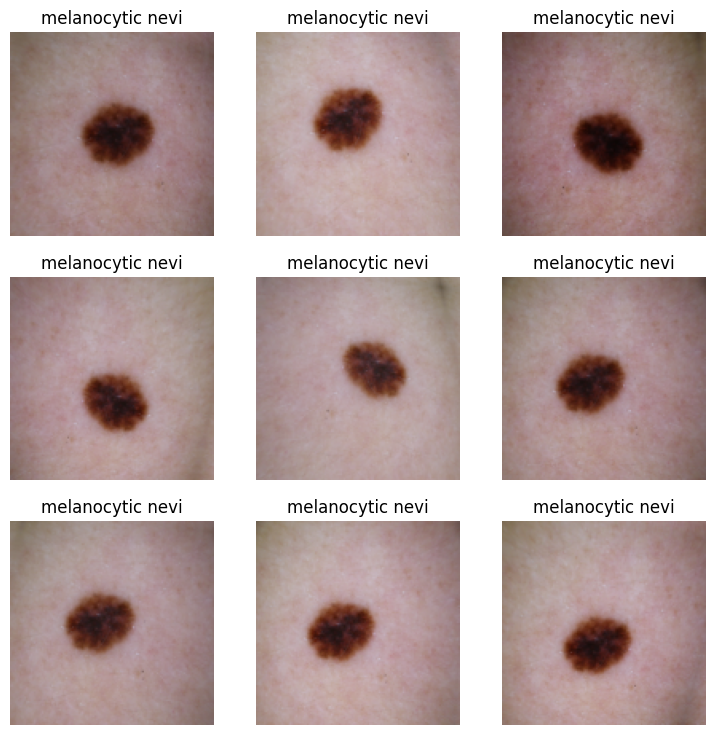

In [ ]:
dls.show_batch(unique=true)

Se puede extraer también una muestra  de uno de los lotes de entrenamiento:

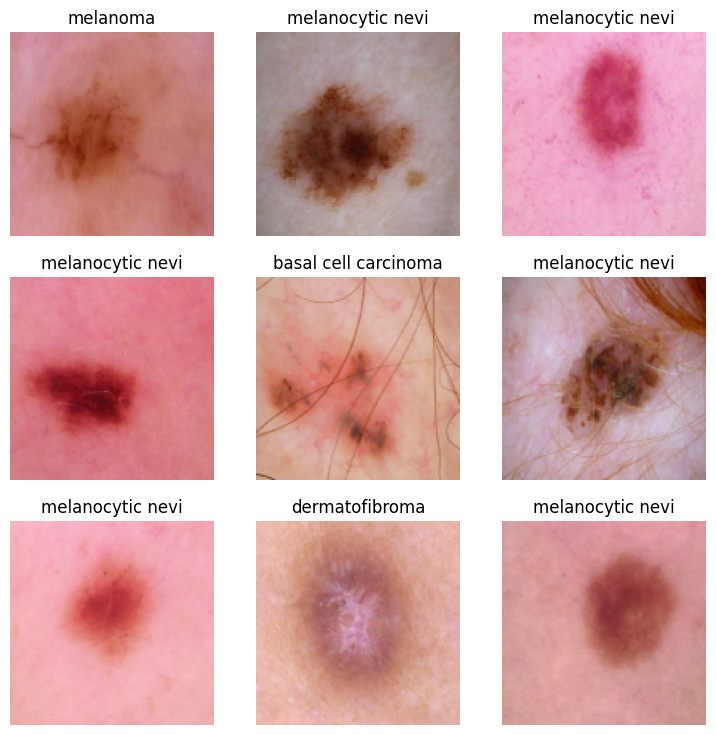

In [ ]:
dls.show_batch()

In [ ]:
learn = vision_learner(dls, 'resnet26d', metrics=[error_rate, accuracy], path='.').to_fp16()

model.safetensors:   0%|          | 0.00/64.2M [00:00<?, ?B/s]

SuggestedLRs(valley=0.0014454397605732083, slide=0.009120108559727669)

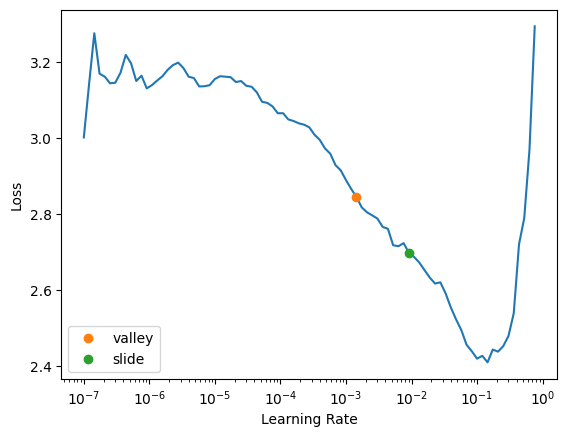

In [ ]:
learn.lr_find(suggest_funcs=(valley, slide))

In [ ]:
learn.fine_tune(5, 0.01)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.187074,0.876949,0.285572,0.714428,00:36


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.753828,0.658998,0.230155,0.769845,00:35
1,0.659472,0.613086,0.226161,0.773839,00:35
2,0.538650,0.525342,0.191213,0.808787,00:35
3,0.462162,0.476765,0.179730,0.820270,00:35
4,0.382643,0.472836,0.183724,0.816276,00:35


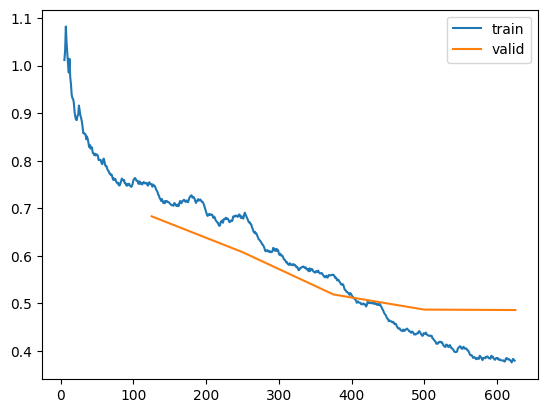

In [ ]:
learn.recorder.plot_loss()

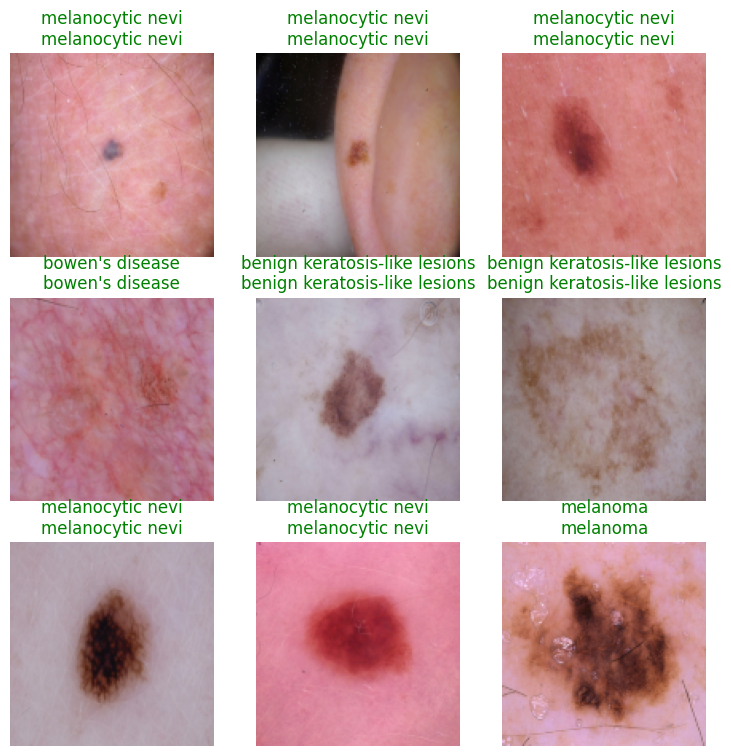

In [ ]:
learn.show_results()

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)

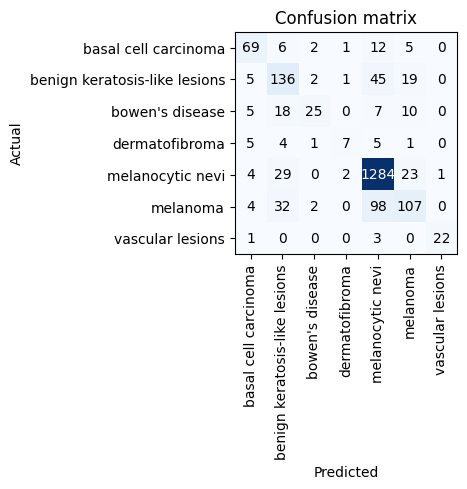

In [ ]:
interp.plot_confusion_matrix()

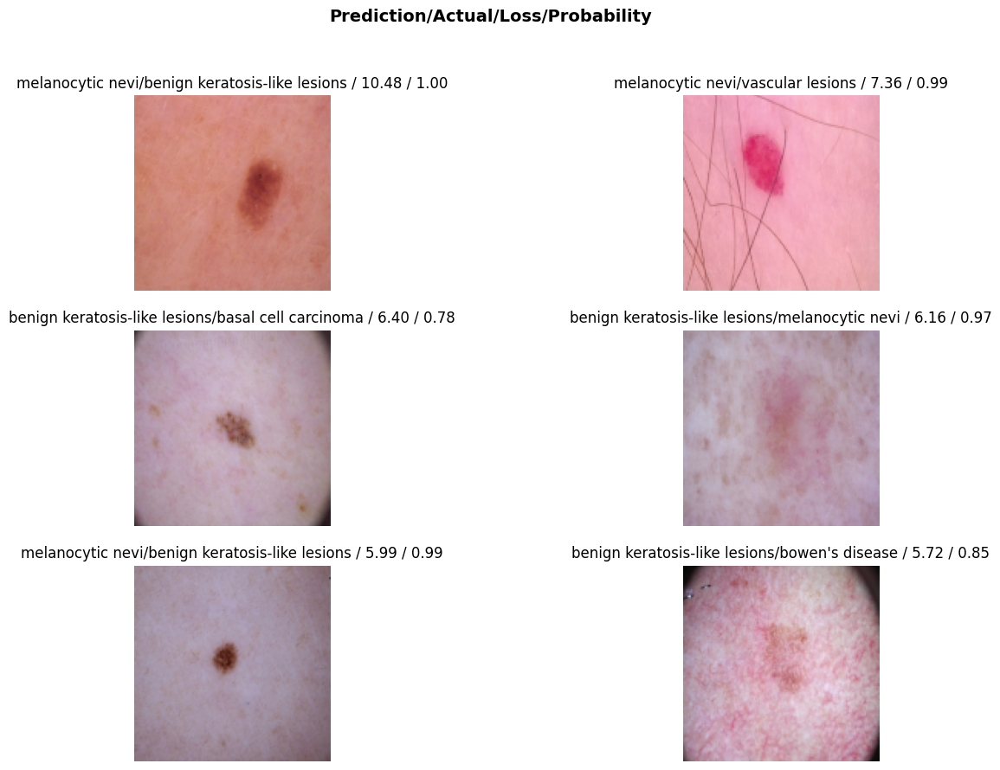

In [ ]:
interp.plot_top_losses(6, nrows=3, figsize=(15,10))

In [ ]:
learn.export('resnet26d-baseline')

###Iteración y optimización con modelos pequeños

Definimos una función que nos sirva como plantilla para ir probando diferentes arquitecturas y estrategias de procesamiento de datos

In [35]:
def train(arch, item, batch, lr=0.01, epochs=5):
    dls = DataBlock(
      blocks=(ImageBlock, CategoryBlock),
      get_items=get_image_files,
      splitter=RandomSplitter(valid_pct=0.2, seed=42),
      get_y=get_label,
      item_tfms=item,
      batch_tfms=batch).dataloaders(train_path)
    learn = vision_learner(dls, arch, metrics=[error_rate, accuracy], path='.').to_fp16()
    learn.fine_tune(epochs, lr)
    return learn

In [19]:
arch = 'resnet26d'

####Comparamos dos modalidades de procesamiento de lotes: aug_transforms y RandomResizedCrop

In [ ]:
learn = train(arch, item=Resize(256), batch=aug_transforms(size=128, min_scale=0.75))

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.256846,0.811406,0.269596,0.730404,09:27


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.740799,0.683103,0.235647,0.764353,00:31
1,0.633294,0.629036,0.224663,0.775337,00:31
2,0.535219,0.518468,0.180729,0.819271,00:32
3,0.434564,0.489609,0.172242,0.827758,00:31
4,0.360980,0.479359,0.172741,0.827259,00:31


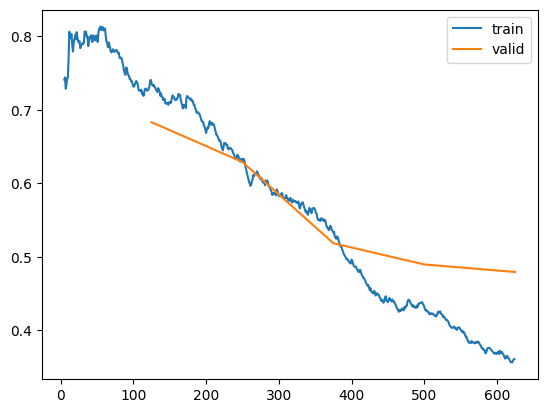

In [ ]:
learn.recorder.plot_loss()

In [22]:
learn = train(arch, item=Resize(256), batch=RandomResizedCrop(size=128, min_scale=0.75))

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.146812,0.711183,0.234648,0.765352,00:36


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.624681,0.582008,0.199201,0.800799,00:39
1,0.527557,0.538809,0.172242,0.827758,00:39
2,0.348161,0.440709,0.144783,0.855217,00:39
3,0.202267,0.398307,0.132302,0.867698,00:40
4,0.127368,0.386508,0.125811,0.874189,00:40


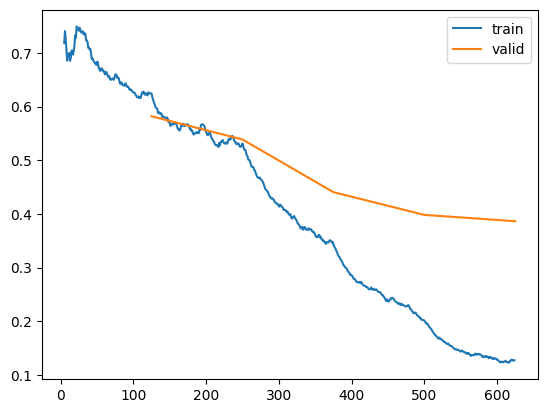

In [23]:
learn.recorder.plot_loss()

El segundo tipo de procesamiento de lotes parece dar ligeramente mejores resultados, aunque por contra aumenta el tiempo de entrenamiento, lo cuál es casi anecdótico con este tamaño de imágenes y con un modelo pequeño, pero puede escalar con imágenes de mayor tamaño o modelos más complejos.

####**ConvNext**

In [36]:
arch2 = 'convnext_small_in22k'

Probamos la eficiencia de la nueva arquitectura, nuevamente comparamos los dos tipos de procesamiento por lotes

In [ ]:
learn = train(arch2, item=Resize(256), batch=aug_transforms(size=128, min_scale=0.75))

/usr/local/lib/python3.10/dist-packages/timm/models/_factory.py:117: UserWarning: Mapping deprecated model name convnext_small_in22k to current convnext_small.fb_in22k.
  model = create_fn(


model.safetensors:   0%|          | 0.00/265M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.143219,0.791431,0.241138,0.758862,00:35


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.635428,0.523454,0.184723,0.815277,00:39
1,0.585011,0.472154,0.171742,0.828258,00:39
2,0.433819,0.411652,0.147279,0.852721,00:39
3,0.321845,0.360815,0.133799,0.866201,00:40
4,0.253268,0.355082,0.127309,0.872691,00:39


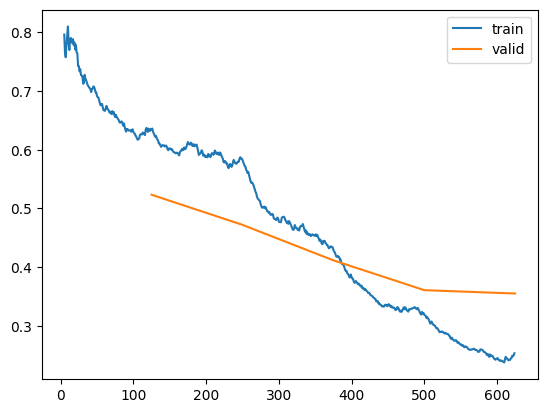

In [ ]:
learn.recorder.plot_loss()

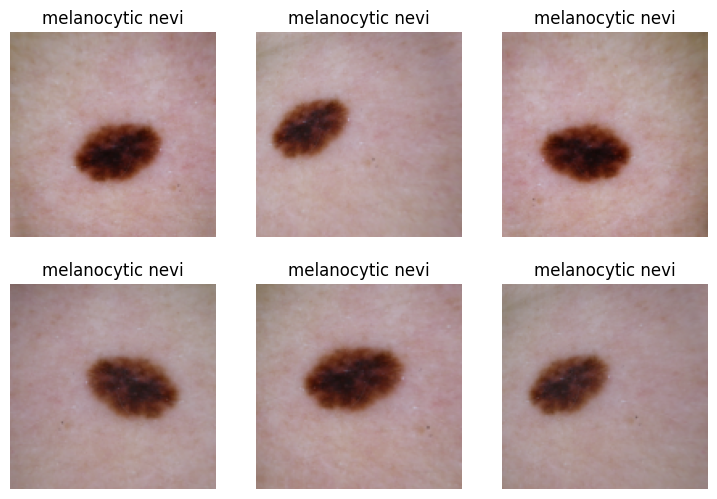

In [ ]:
learn.dls.train.show_batch(max_n=6, unique=True)

In [30]:
learn = train(arch2, item=Resize(256), batch=RandomResizedCrop(size=128, min_scale=0.75))

/usr/local/lib/python3.10/dist-packages/timm/models/_factory.py:117: UserWarning: Mapping deprecated model name convnext_small_in22k to current convnext_small.fb_in22k.
  model = create_fn(


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.046381,0.741712,0.216675,0.783325,01:06


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.549825,0.452514,0.148777,0.851223,01:25
1,0.478143,0.451328,0.154269,0.845731,01:27
2,0.322614,0.332417,0.121318,0.878682,01:27
3,0.153991,0.283763,0.092861,0.907139,01:28
4,0.092464,0.277005,0.089366,0.910634,01:28


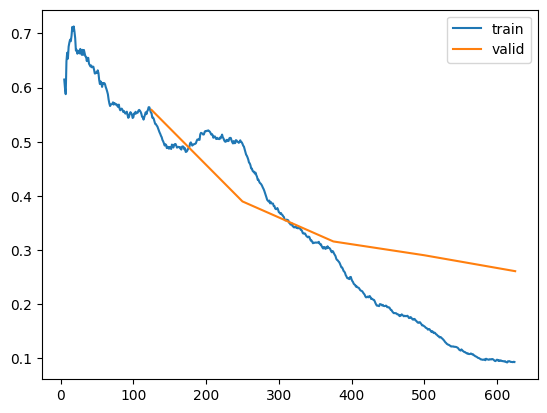

In [40]:
learn.recorder.plot_loss()

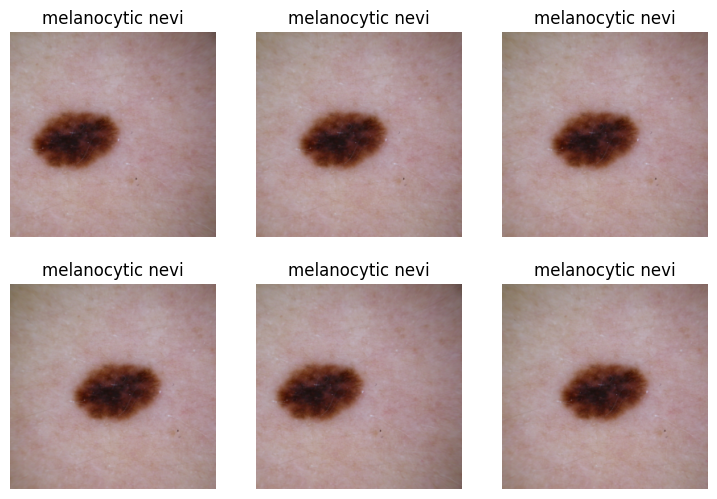

In [41]:
learn.dls.train.show_batch(max_n=6, unique=True)

Se comparan los dos tipos de procesamiento por lote probados en el anterior modelo en este nuevo modelo de arquitectura convnext. En primer lugar, se aprecia un mejor rendimiento del modelo convnext respecto al resnet. Este último arroja unos mejores resultados, en precisión y especialmente en las tasas de pérdida en los conjuntos de entrenamiento y validación, que consigue disminuir notablemente, sobretodo en el modelo con el procesamiento de lote de tipo RandomResizedCrop más eficaz.

Teniendo en cuenta lo anterior, en el siguiente apartado, en el que se probarán diferentes técnicas de preprocesado, se utilizará el modelo de **convnext** y el procesamiento en lotes mediante **RandomResizedCrop**

###**Preprocesado**

Probamos diferentes enfoques de preprocesado como el resize mediante squish o padding, para ver si se puede mejorar el rendimiento respecto al redimensionado por defecto.

#### Resize = squish

In [27]:
learn = train(arch2, item=Resize(256,  method='squish'), batch=RandomResizedCrop(size=128, min_scale=0.75))

/usr/local/lib/python3.10/dist-packages/timm/models/_factory.py:117: UserWarning: Mapping deprecated model name convnext_small_in22k to current convnext_small.fb_in22k.
  model = create_fn(


model.safetensors:   0%|          | 0.00/265M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.065018,0.767337,0.246630,0.753370,01:06


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.568267,0.450461,0.161258,0.838742,01:25
1,0.434218,0.401784,0.144284,0.855716,01:27
2,0.278632,0.378187,0.114828,0.885172,01:27
3,0.106969,0.298206,0.097853,0.902147,01:28
4,0.042093,0.286212,0.096855,0.903145,01:28


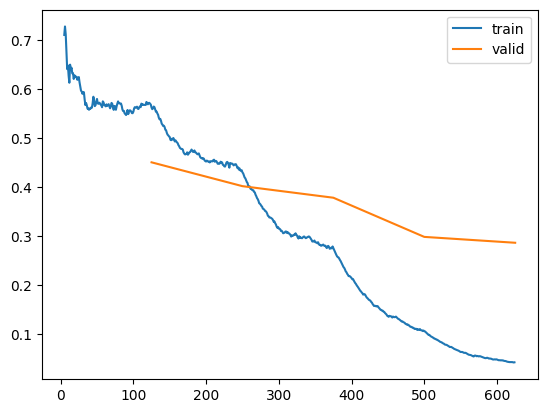

In [28]:
learn.recorder.plot_loss()

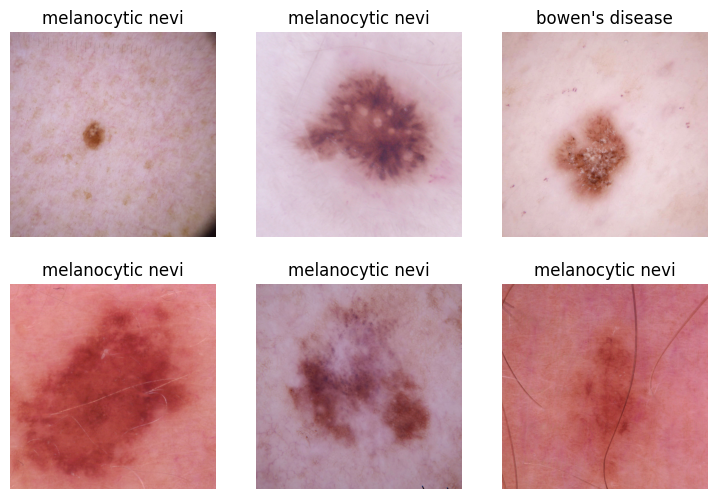

In [29]:
dls.train.show_batch(max_n=6)

In [ ]:
learn.export('convnext_small_in22k_first')

####**Padding**

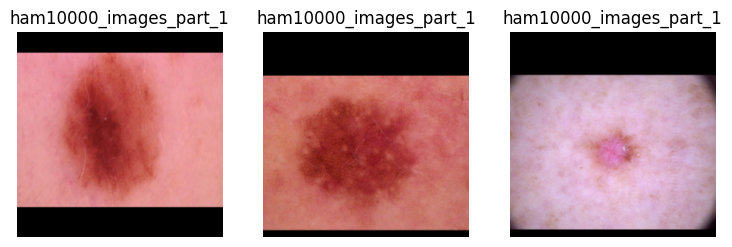

In [ ]:
dls = ImageDataLoaders.from_folder(train_path, valid_pct=0.2, seed=42,
    item_tfms=Resize((256), method=ResizeMethod.Pad, pad_mode=PadMode.Zeros))
dls.show_batch(max_n=3)

In [37]:
learn = train(arch2, item=Resize((256), method=ResizeMethod.Pad, pad_mode=PadMode.Zeros),
      batch=RandomResizedCrop(size=128, min_scale=0.75))

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.090992,0.804375,0.253120,0.746880,01:06


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.588721,0.446470,0.159760,0.840240,01:26
1,0.498633,0.475339,0.178732,0.821268,01:27
2,0.322395,0.354409,0.130804,0.869196,01:28
3,0.178452,0.311503,0.101847,0.898153,01:28
4,0.097092,0.292001,0.097354,0.902646,01:28


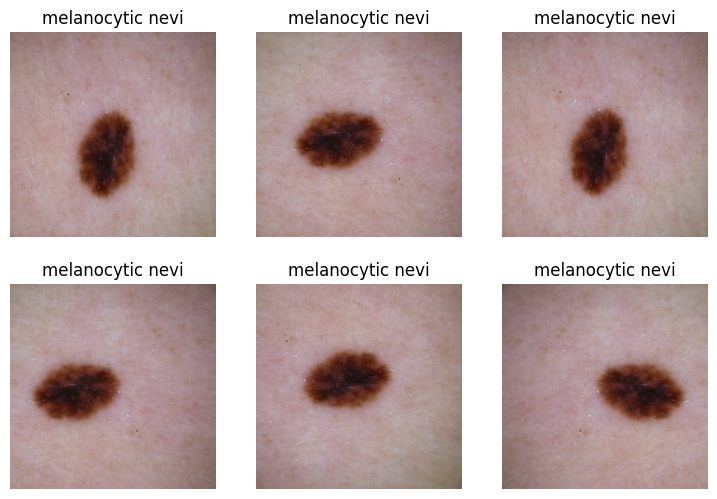

In [42]:
dls.train.show_batch(max_n=6, unique=True)

In [38]:
valid = learn.dls.valid
preds,targs = learn.get_preds(dl=valid)

In [39]:
error_rate(preds,targs)

TensorBase(0.0974)

In [40]:
tta_preds,_ = learn.tta(dl=valid)

In [41]:
error_rate(tta_preds, targs)

TensorBase(0.0989)

#####Croping + Dihedral

Probamos una combinación de estrategias de preprocesamiento.

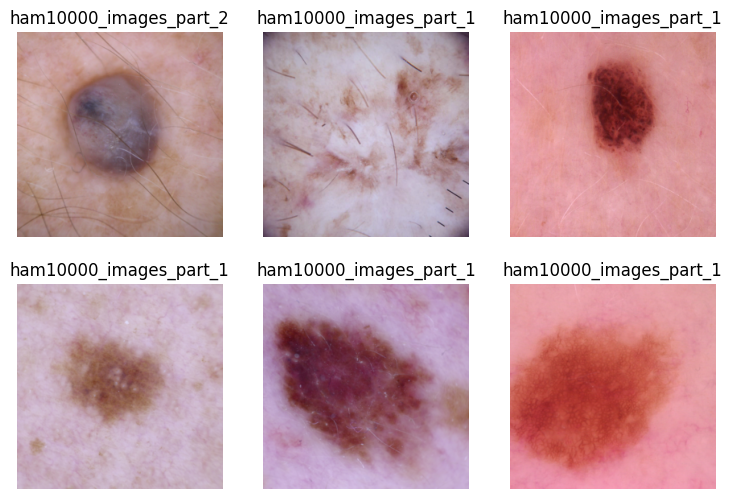

In [ ]:
dls = ImageDataLoaders.from_folder(train_path, valid_pct=0.2, seed=42,
    item_tfms=[Resize(256), DihedralItem()])
dls.show_batch(max_n=6)

In [49]:
learn = train(arch2, item=[Resize(256), DihedralItem()],
      batch=RandomResizedCrop(size=(128), min_scale=0.75))

/usr/local/lib/python3.10/dist-packages/timm/models/_factory.py:117: UserWarning: Mapping deprecated model name convnext_small_in22k to current convnext_small.fb_in22k.
  model = create_fn(


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.094945,0.735313,0.201697,0.798303,01:15


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.568122,0.538399,0.196206,0.803794,01:34
1,0.476095,0.531021,0.183724,0.816276,01:34
2,0.369295,0.326613,0.116326,0.883675,01:34
3,0.221426,0.257885,0.098852,0.901148,01:34
4,0.166150,0.251214,0.097354,0.902646,01:33


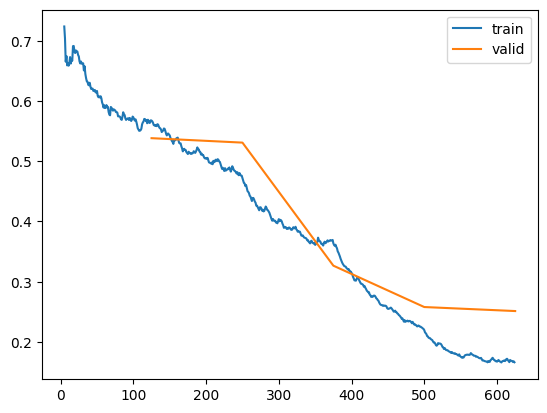

In [50]:
learn.recorder.plot_loss()

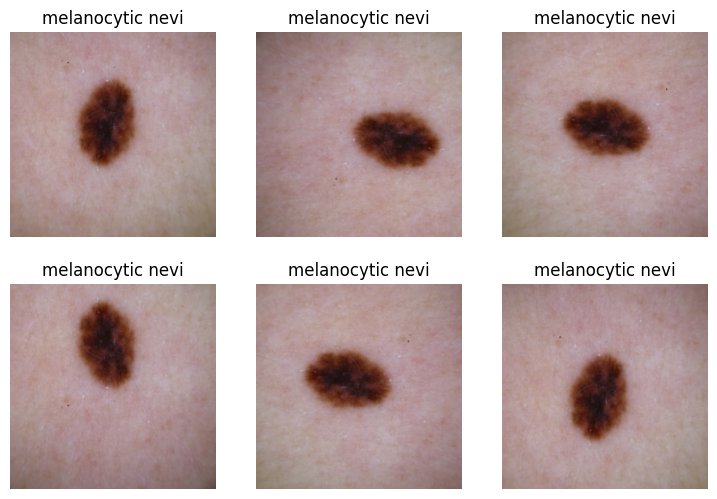

In [43]:
learn.dls.train.show_batch(max_n=6, unique=True)

####**Test Time Augmentation**

Comprobamos el error_rate sin TTA

In [44]:
valid = learn.dls.valid
preds,targs = learn.get_preds(dl=valid)

In [45]:
error_rate(preds, targs)


TensorBase(0.0959)

In [46]:
tta_preds,_ = learn.tta(dl=valid)

In [47]:
error_rate(tta_preds, targs)

TensorBase(0.0874)

La reducción de la tasa de error es considerable en las cifras tan altas que nos movemos, por lo que añadiremos el TTA al procesamiento en modelos más grandes.

###Escalamos a un mayor tamaño de imágenes y un número mayor de epochs

Una vez elegida la estrategia de procesamiento que ha ofrecido mejores resultados, que sería el RandomResizedCrop para el procesamiento en lotes y el Resize default en el preprocesado, probamos con un tamaño de imágenes mayor, prácticamente la resolución original, y más épocas (12)

#####Prueba con aug_transforms

In [ ]:
learn = train(arch2, epochs=12,
              item=Resize(450),
              batch=aug_transforms(size=(224), min_scale=0.75))

/usr/local/lib/python3.10/dist-packages/timm/models/_factory.py:117: UserWarning: Mapping deprecated model name convnext_small_in22k to current convnext_small.fb_in22k.
  model = create_fn(


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.078222,0.861478,0.266101,0.733899,00:59


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.562622,0.542675,0.197204,0.802796,01:16
1,0.448956,0.449666,0.172242,0.827758,01:17
2,0.429488,0.389279,0.151772,0.848228,01:18
3,0.384704,0.387974,0.136296,0.863704,01:18
4,0.285917,0.306711,0.112831,0.887169,01:18
5,0.236127,0.365287,0.118822,0.881178,01:18
6,0.182009,0.353650,0.110834,0.889166,01:17
7,0.118620,0.305834,0.102846,0.897154,01:18
8,0.085367,0.479652,0.135297,0.864703,01:18
9,0.070012,0.340091,0.098852,0.901148,01:17


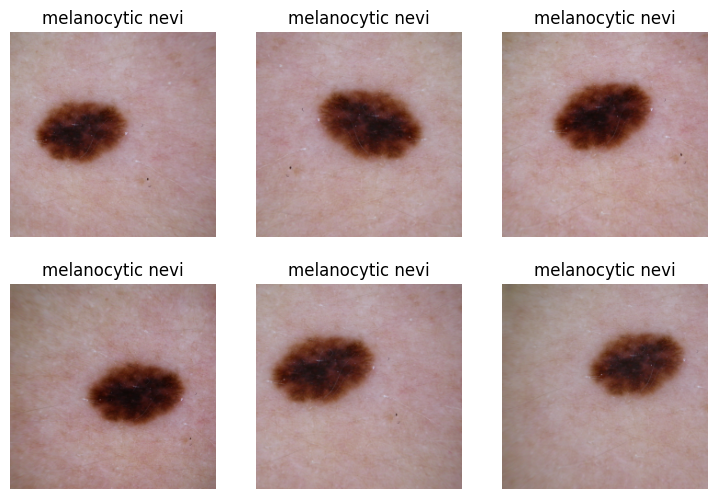

In [ ]:
learn.dls.train.show_batch(max_n=6, unique=True)

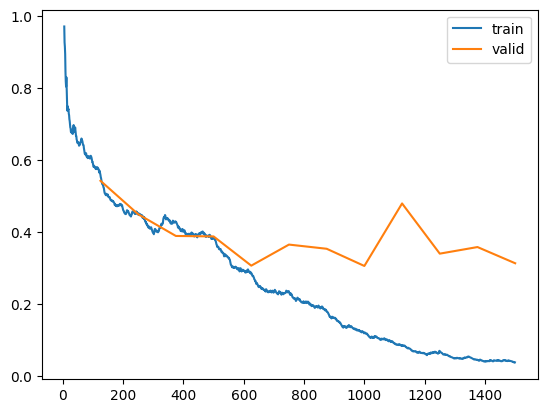

In [ ]:
learn.recorder.plot_loss()

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)

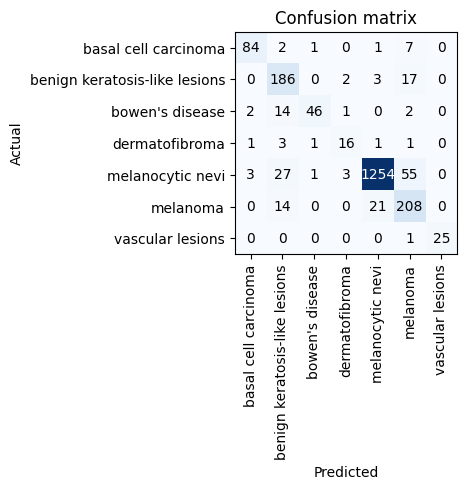

In [ ]:
interp.plot_confusion_matrix()

In [ ]:
valid = learn.dls.valid
preds,targs = learn.get_preds(dl=valid)

In [ ]:
error_rate(preds, targs)


TensorBase(0.0919)

In [ ]:
tta_preds,_ = learn.tta(dl=valid)

In [ ]:
error_rate(tta_preds, targs)

TensorBase(0.0709)

In [ ]:
learn.export('convnext_small_in22k_second')

NameError: ignored

#####Prueba random_resized_crop

In [16]:
import torch
torch.cuda.empty_cache()

In [18]:
learn = train(arch2, epochs=12,
              item=Resize(450),
              batch=RandomResizedCrop(size=224, min_scale=0.75))

/usr/local/lib/python3.10/dist-packages/timm/models/_factory.py:117: UserWarning: Mapping deprecated model name convnext_small_in22k to current convnext_small.fb_in22k.
  model = create_fn(


model.safetensors:   0%|          | 0.00/265M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.067782,0.587720,0.198203,0.801797,07:37


epoch,train_loss,valid_loss,error_rate,accuracy,time


OutOfMemoryError: ignored

In [17]:
dls = DataBlock(
      blocks=(ImageBlock, CategoryBlock),
      get_items=get_image_files,
      splitter=RandomSplitter(valid_pct=0.2, seed=42),
      get_y=get_label,
      item_tfms=Resize(450),
      batch_tfms=RandomResizedCrop(size=224, min_scale=0.75)).dataloaders(train_path, bs=32)
learn = vision_learner(dls, arch2, metrics=[error_rate, accuracy], path='.').to_fp16()
learn.fine_tune(12, 0.01)

/usr/local/lib/python3.10/dist-packages/timm/models/_factory.py:117: UserWarning: Mapping deprecated model name convnext_small_in22k to current convnext_small.fb_in22k.
  model = create_fn(


model.safetensors:   0%|          | 0.00/265M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.942741,0.611404,0.191712,0.808288,10:30


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.505987,0.397224,0.132801,0.867199,04:04
1,0.470728,0.432394,0.141288,0.858712,04:03
2,0.375705,0.361129,0.128807,0.871193,04:03
3,0.314005,0.382523,0.116326,0.883675,04:03
4,0.290211,0.337694,0.108337,0.891662,04:03
5,0.156720,0.409280,0.118323,0.881678,04:03
6,0.104323,0.307849,0.082376,0.917624,04:03
7,0.072483,0.263771,0.071892,0.928108,04:03
8,0.035200,0.274014,0.065402,0.934598,04:03
9,0.017875,0.267080,0.065901,0.934099,04:03


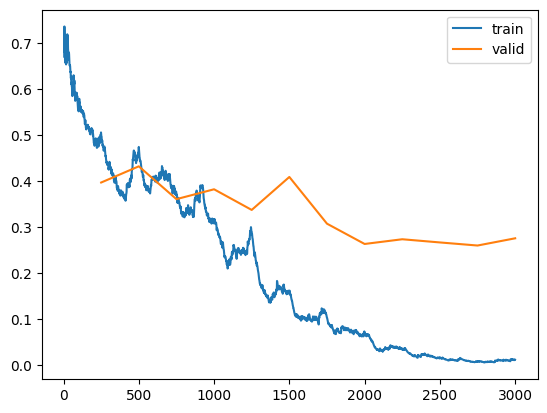

In [19]:
learn.recorder.plot_loss()

In [18]:
learn.export('convnext_small_in22k_second')

In [20]:
valid = learn.dls.valid
preds,targs = learn.get_preds(dl=valid)

In [21]:
error_rate(preds,targs)

TensorBase(0.0634)

In [23]:
tta_preds,targs = learn.tta(dl=learn.dls.valid)

In [24]:
error_rate(tta_preds,targs)

TensorBase(0.0599)

####Predicción con el set de test

In [15]:
tst_files = get_image_files('/content/drive/MyDrive/Colab Notebooks/TFG/HAM10000/ISIC2018_Task3_Test_Input').sorted()

In [16]:
learner = load_learner('/content/drive/MyDrive/Colab Notebooks/TFG/HAM10000/convnext_small_in22k_second')

In [17]:
tst_dl = learner.dls.test_dl(tst_files)

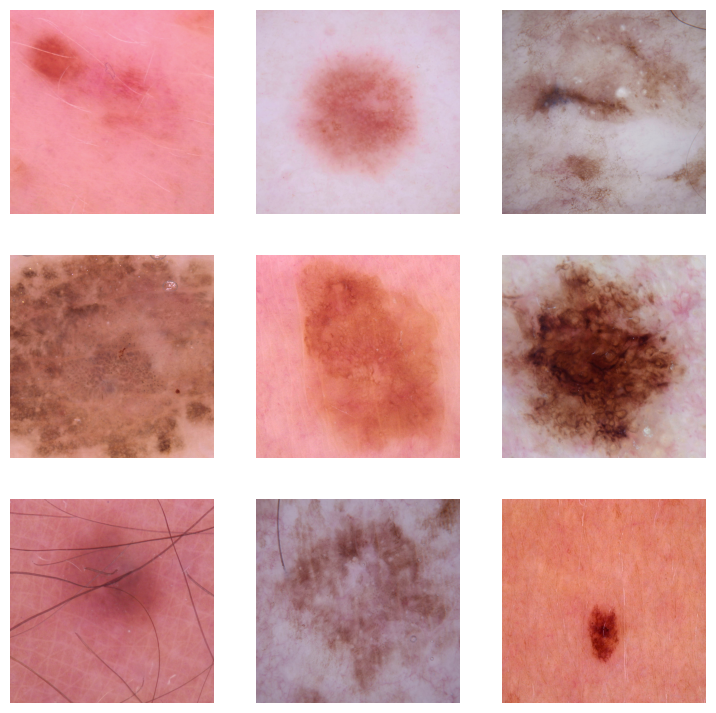

In [28]:
tst_dl.show_batch(max_n=9)

In [18]:
preds,_ = learner.tta(dl=tst_dl)

In [19]:
idxs = preds.argmax(dim=1)

In [21]:
vocab = np.array(learner.dls.vocab)
results = pd.Series(vocab[idxs], name="idxs")

In [23]:
ground_truth = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/TFG/HAM10000/test_ground_truth.csv')  # Reemplaza 'ground_truth.csv' con tu nombre de archivo
ground_truth['dx'] = ground_truth['dx'].str.lower().map(short_to_full_name_dict)

In [22]:
results

0                    melanocytic nevi
1                    melanocytic nevi
2       benign keratosis-like lesions
3                    melanocytic nevi
4                    melanocytic nevi
                    ...              
1507    benign keratosis-like lesions
1508                 melanocytic nevi
1509                  bowen's disease
1510    benign keratosis-like lesions
1511    benign keratosis-like lesions
Name: idxs, Length: 1512, dtype: object

In [29]:
targets = pd.Series(ground_truth['dx'])
targets

0                    melanocytic nevi
1                    melanocytic nevi
2       benign keratosis-like lesions
3                    melanocytic nevi
4                    melanocytic nevi
                    ...              
1507    benign keratosis-like lesions
1508                 melanocytic nevi
1509                  bowen's disease
1510    benign keratosis-like lesions
1511             basal cell carcinoma
Name: dx, Length: 1512, dtype: object

In [31]:
from sklearn.metrics import accuracy_score
accuracy_score(targets, results)

0.8882275132275133

###**Modelos Más Grandes**

##Test Inicial##

En cuanto al Datablock, elegimos dar a

In [ ]:
learn = vision_learner(dls, resnet18, metrics=[error_rate, accuracy])
learn.fine_tune(3)



Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 68.0MB/s]


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.891833,0.673863,0.227659,0.772341,05:17


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.479797,0.398204,0.145032,0.854968,04:54
1,0.224073,0.160032,0.046930,0.953070,05:05
2,0.050432,0.116482,0.029456,0.970544,05:05


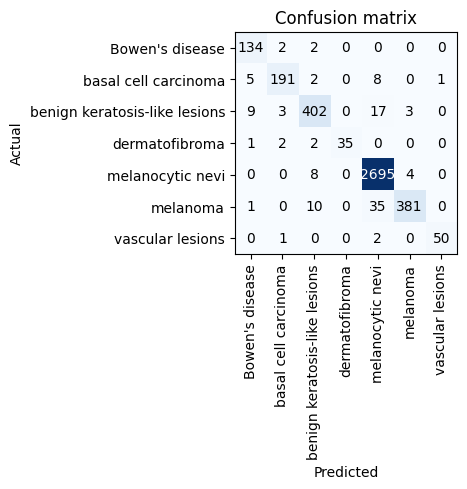

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

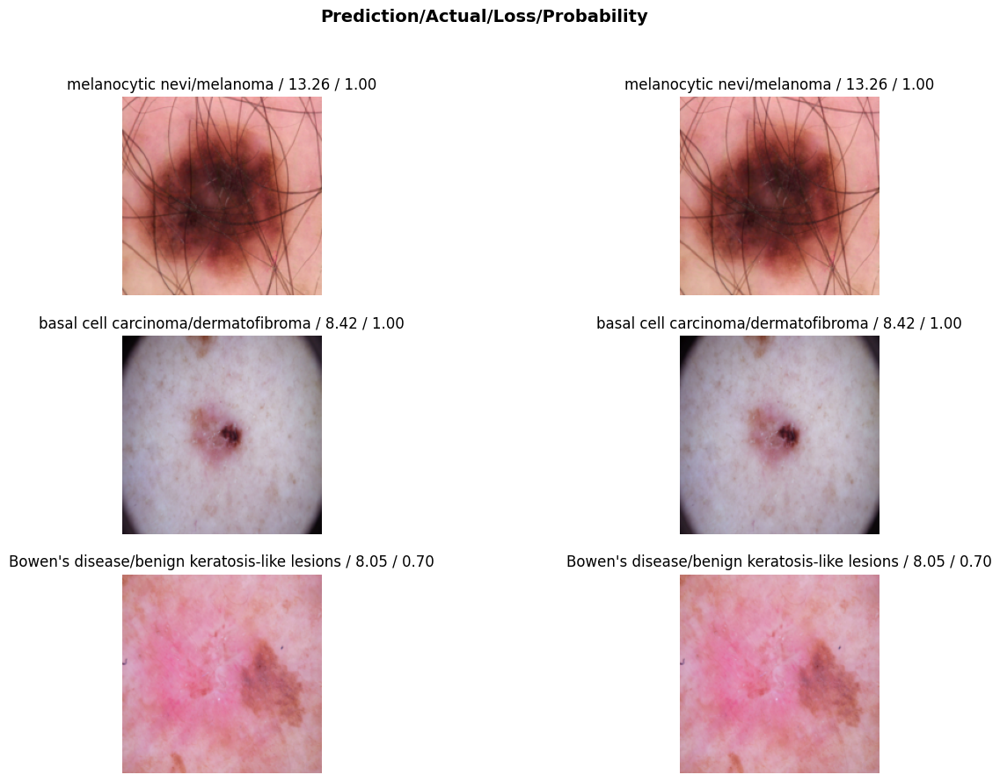

In [ ]:
interp.plot_top_losses(6, nrows=3, figsize=(15,10))

In [ ]:
dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=get_label,
    batch_tfms=aug_transforms(size=128, min_scale=0.75)).dataloaders(path, bs=32)


In [ ]:
#tamaño de los datasets de entrenamiento y de validación
len(dls.train_ds), len(dls.valid_ds)

(8012, 2003)

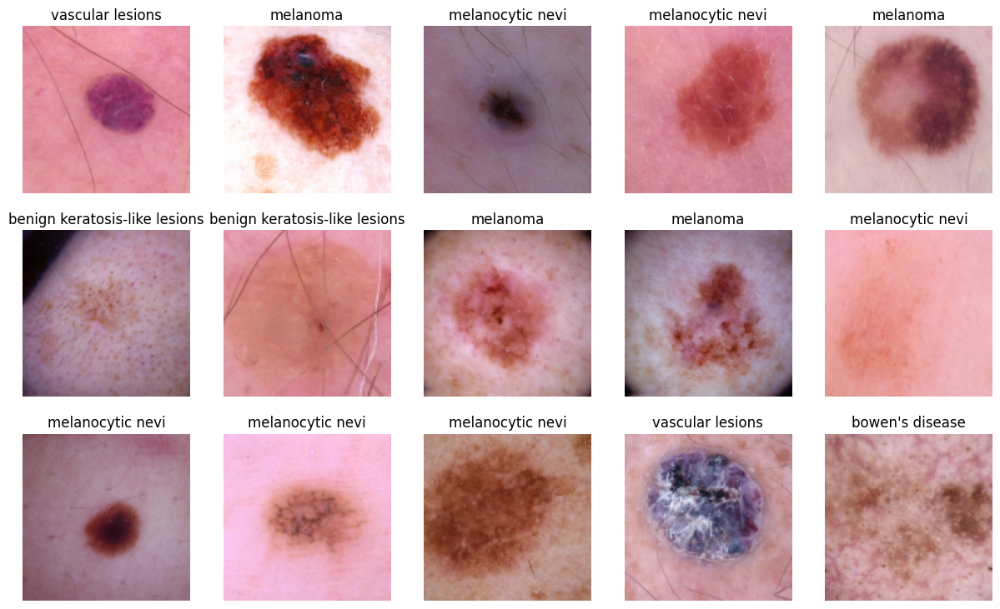

In [ ]:
dls.show_batch(max_n=15)

##Segundo Test#

In [ ]:
learn = vision_learner(dls, 'resnet26d', metrics=error_rate, path='.').to_fp16()

model.safetensors:   0%|          | 0.00/64.2M [00:00<?, ?B/s]

In [ ]:
learn.model

Sequential(
  (0): TimmBody(
    (model): ResNet(
      (conv1): Sequential(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
        (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (act1): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-0

SuggestedLRs(valley=0.004365158267319202, slide=0.009120108559727669)

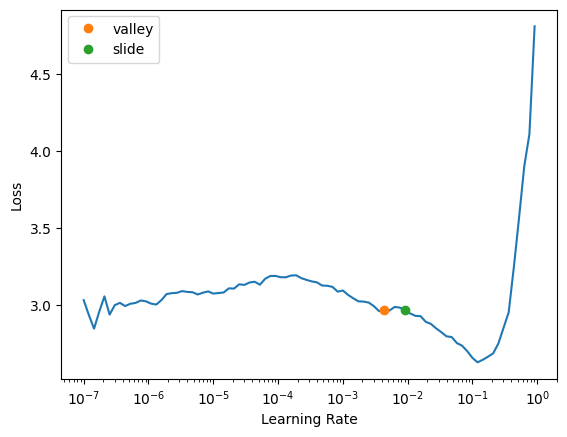

In [ ]:
learn.lr_find(suggest_funcs=(valley, slide))

In [ ]:
learn.fine_tune(3, 0.01)

epoch,train_loss,valid_loss,error_rate,time
0,1.090144,0.909613,0.283075,21:32


epoch,train_loss,valid_loss,error_rate,time
0,0.766558,0.714505,0.243635,02:04
1,0.626017,0.548809,0.201697,02:06
2,0.492082,0.501293,0.184224,01:58


##Resultados TFG##

Definimos una estructura de Datablock de la API de fastai que nos permite definir:


*   El tipo de elemento de los bloques (Imagen y categoría)
*   La randomización del conjunto inicial en un conjunto de entrenamiento (80%) y validación (20%). Definimos un seed para garantizar la reproductibilidad.


*   Definimos la función que permite obtener las etiquetas de las imágenes.
*   Hacemos un aumento de las imágenes de 600*600 que es la dimensión mayor de las imágnes originales, para que al reducir el tamaño para el entrenamiento por lotes (batch_tfms) al que se aplicará además el aumento (aug_transforms) no se pierda información útil.





In [ ]:
dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=get_label,
    item_tfms=Resize(600, method='squish'),
    batch_tfms=aug_transforms(size=128, min_scale=0.75)
).dataloaders(path)

TypeError: ignored

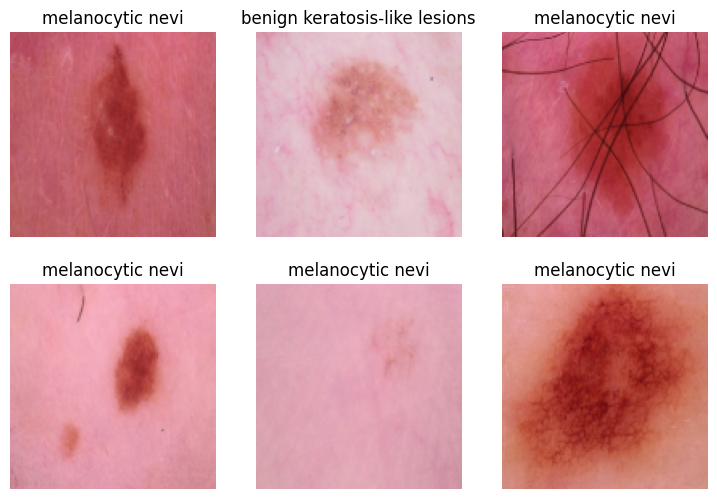

In [ ]:
dls.show_batch(max_n = 6)

In [ ]:
learn = vision_learner(dls, 'resnet26d', metrics=error_rate, path='.', cbs=SaveModelCallback(with_opt=True, fname="ckpt")).to_fp16()

In [ ]:
learn.model

Sequential(
  (0): TimmBody(
    (model): ResNet(
      (conv1): Sequential(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
        (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (act1): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-0

###Prueba A###

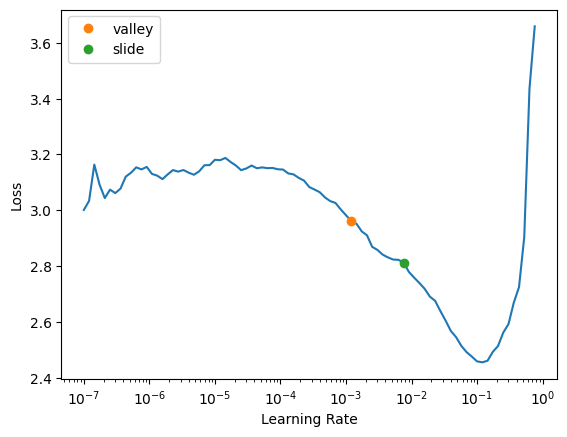

In [ ]:
lrs = learn.lr_find(suggest_funcs=(valley, slide))

In [ ]:
lrs

SuggestedLRs(valley=0.0012022644514217973, slide=0.007585775572806597)

In [ ]:
learn.fine_tune(3, lrs.valley)

epoch,train_loss,valid_loss,error_rate,time
0,1.822136,1.073783,0.302546,00:39


Better model found at epoch 0 with valid_loss value: 1.073783278465271.


epoch,train_loss,valid_loss,error_rate,time
0,1.150936,0.863832,0.260110,00:40
1,0.901045,0.709877,0.231653,00:40
2,0.768341,0.665132,0.221168,00:40


Better model found at epoch 0 with valid_loss value: 0.8638321757316589.
Better model found at epoch 1 with valid_loss value: 0.7098768949508667.
Better model found at epoch 2 with valid_loss value: 0.665132462978363.


In [ ]:
learn.save("opt_a_model")

Path('models/opt_a_model.pth')

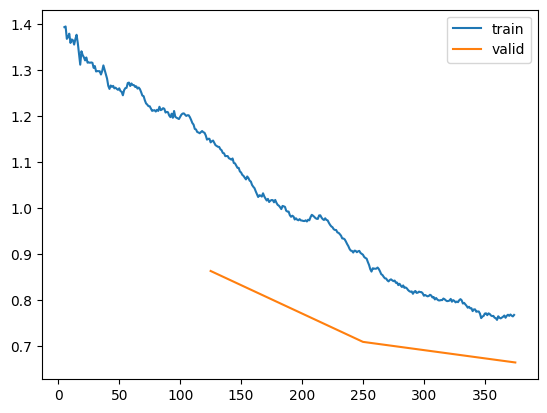

In [ ]:
learn.recorder.plot_loss()

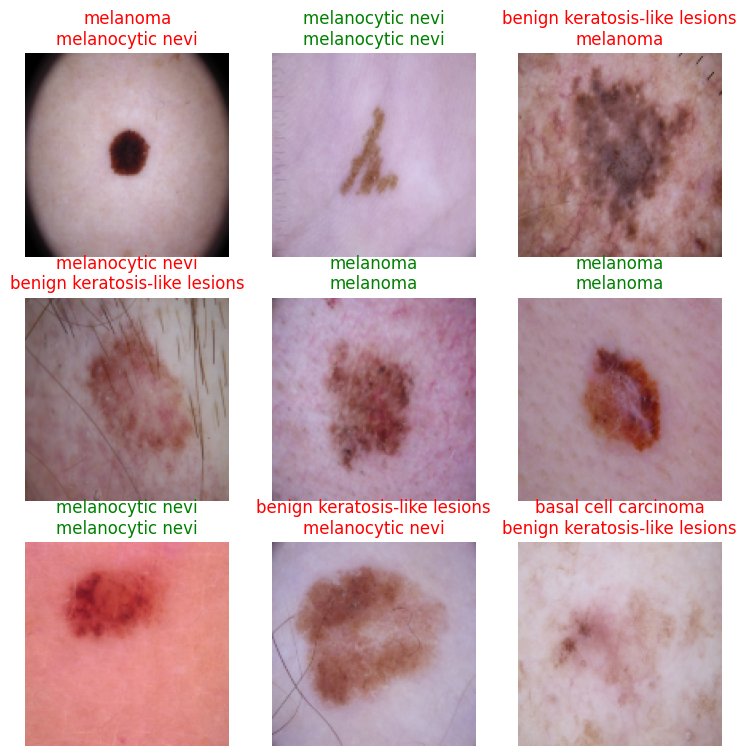

In [ ]:
learn.show_results()

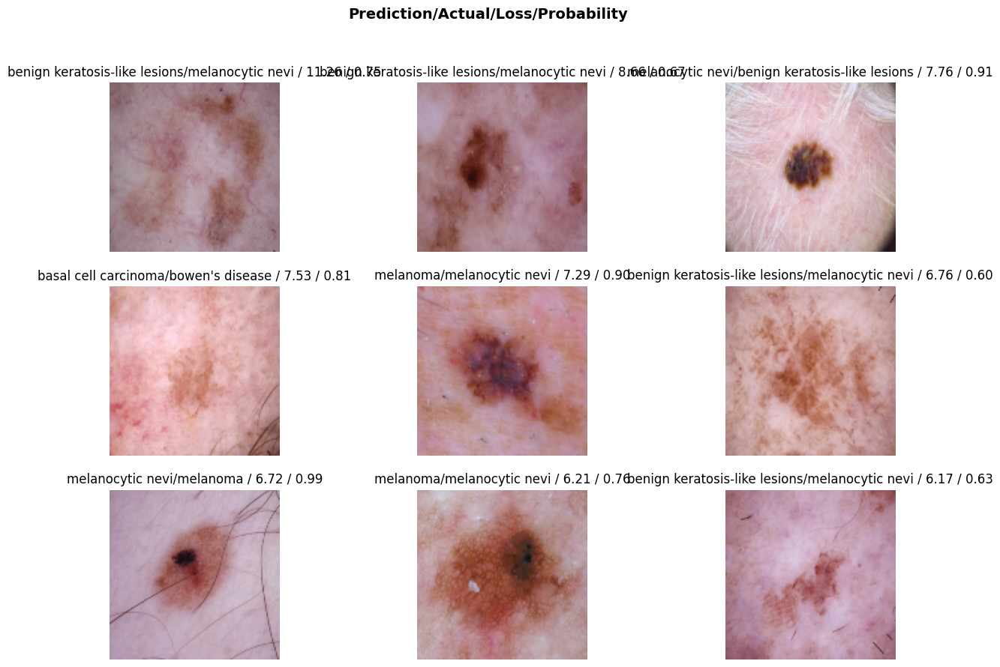

In [ ]:
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(9, figsize=(15,10))

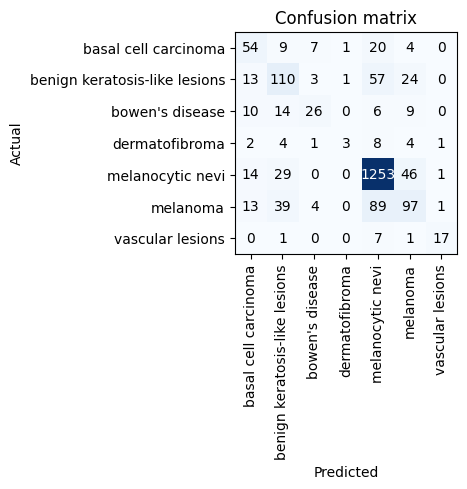

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [ ]:
learn.unfreeze()

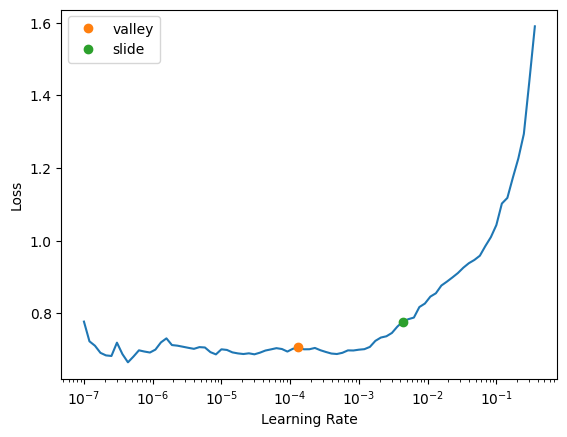

In [ ]:
lrs = learn.lr_find(suggest_funcs=(valley,slide))

In [ ]:
learn.fine_tune(5, lrs.valley)

epoch,train_loss,valid_loss,error_rate,time
0,0.709150,0.647455,0.223165,00:41


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e2be5dcbeb0>
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e2be5dcbeb0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
Exception ignored in:     <function _MultiProcessingDataLoaderIter.__del__ at 0x7e2be5dcbeb0>Traceback (most recent call last):

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
self._shutdown_workers()    
self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
  File "/us

Better model found at epoch 0 with valid_loss value: 0.6474547982215881.


epoch,train_loss,valid_loss,error_rate,time
0,0.712936,0.643853,0.220170,00:40
1,0.719477,0.625544,0.207688,00:41
2,0.680475,0.620162,0.215676,00:39
3,0.663111,0.615410,0.214678,00:41
4,0.651242,0.610026,0.212182,00:40


Better model found at epoch 0 with valid_loss value: 0.6438534259796143.
Better model found at epoch 1 with valid_loss value: 0.6255441308021545.
Better model found at epoch 2 with valid_loss value: 0.6201615333557129.
Better model found at epoch 3 with valid_loss value: 0.6154095530509949.
Better model found at epoch 4 with valid_loss value: 0.6100256443023682.


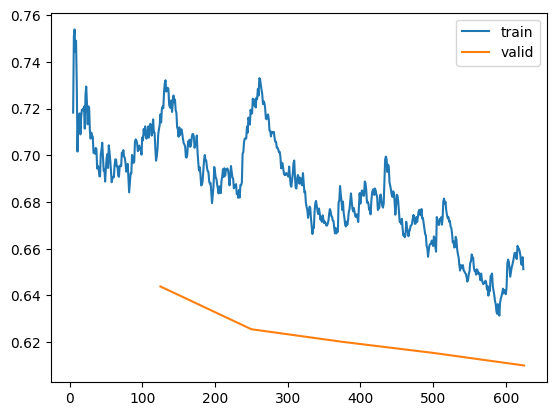

In [ ]:
learn.recorder.plot_loss()

###Prueba B####

SuggestedLRs(valley=0.0012022644514217973, slide=0.007585775572806597)

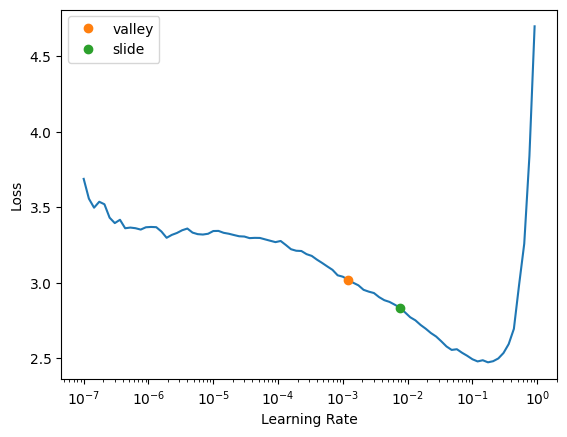

In [ ]:
learn.lr_find(suggest_funcs=(valley, slide))

In [ ]:
learn.fit_one_cycle(1, 1e-2)

epoch,train_loss,valid_loss,error_rate,time
0,0.976665,0.691449,0.238642,04:54


Better model found at epoch 0 with valid_loss value: 0.6914494037628174.


In [ ]:
learn.unfreeze()

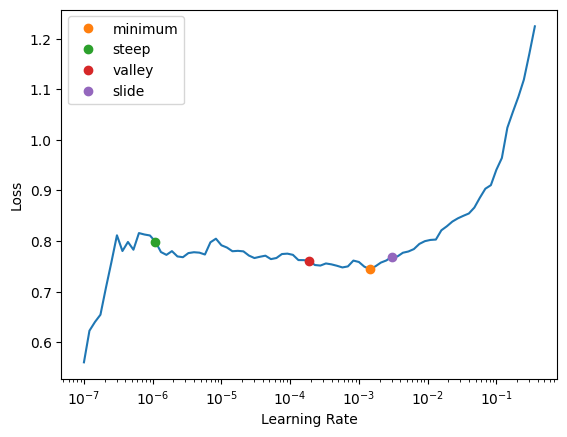

In [ ]:
lrs = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

In [ ]:
learn.fit_one_cycle(3, lrs.valley)

epoch,train_loss,valid_loss,error_rate,time
0,0.692896,0.610929,0.206690,00:39
1,0.535281,0.483094,0.177234,00:39
2,0.434553,0.461171,0.162756,00:39


Better model found at epoch 0 with valid_loss value: 0.6109294295310974.
Better model found at epoch 1 with valid_loss value: 0.48309439420700073.
Better model found at epoch 2 with valid_loss value: 0.46117091178894043.


In [ ]:
learn.save("opt_b_model")

Path('models/opt_b_model.pth')

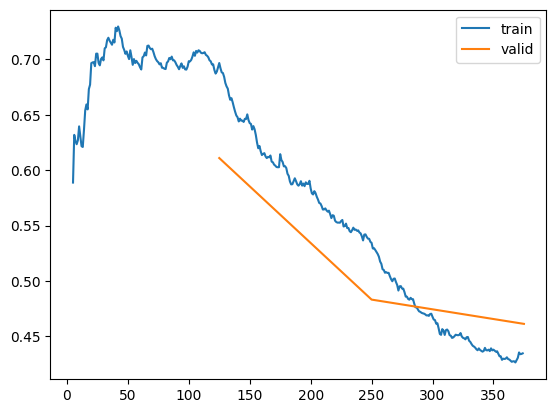

In [ ]:
learn.recorder.plot_loss()

##Prueba de inferencia

In [ ]:
learner_inf = load_learner(path+"/export.pkl")

In [ ]:
tst_files = get_image_files('/content/drive/MyDrive/Colab Notebooks/TFG/HAM10000/ISIC2018_Task3_Test_Input').sorted()

In [ ]:
print(len(tst_files))

1512


In [ ]:
tst_dl = learner_inf.dls.test_dl(tst_files)

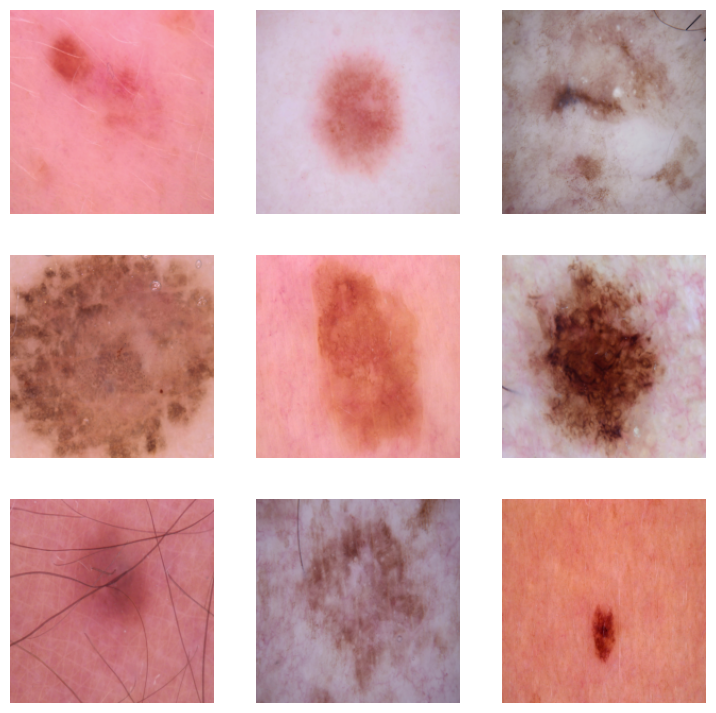

In [ ]:
tst_dl.show_batch(max_n=9)

In [ ]:
probs,_,idxs = learner_inf.get_preds(dl=tst_dl, with_decoded=True)
idxs

/usr/local/lib/python3.10/dist-packages/fastai/torch_core.py:263: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  return getattr(torch, 'has_mps', False)


tensor([4, 4, 2,  ..., 0, 2, 1])

In [ ]:
learner_inf.dls.vocab

["Bowen's disease", 'basal cell carcinoma', 'benign keratosis-like lesions', 'dermatofibroma', 'melanocytic nevi', 'melanoma', 'vascular lesions']

In [ ]:
mapping = dict(enumerate(learner_inf.dls.vocab))
preds = pd.Series(idxs.numpy(), name="idxs").map(mapping)
preds

0                    melanocytic nevi
1                    melanocytic nevi
2       benign keratosis-like lesions
3                    melanocytic nevi
4                    melanocytic nevi
                    ...              
1507    benign keratosis-like lesions
1508                 melanocytic nevi
1509                  Bowen's disease
1510    benign keratosis-like lesions
1511             basal cell carcinoma
Name: idxs, Length: 1512, dtype: object

In [ ]:
mapping

{0: "Bowen's disease",
 1: 'basal cell carcinoma',
 2: 'benign keratosis-like lesions',
 3: 'dermatofibroma',
 4: 'melanocytic nevi',
 5: 'melanoma',
 6: 'vascular lesions'}

In [ ]:
import pandas as pd

# Lectura del archivo CSV original
data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/TFG/HAM10000/ISIC2018_Task3_Test_GroundTruth.csv')

# Obtener los nombres de las columnas de categorías
categorias = data.columns[1:].tolist()

# Crear un nuevo DataFrame con la estructura deseada
nuevos_datos = []
for _, fila in data.iterrows():
    image_id = fila['image']
    for categoria in categorias:
        if fila[categoria] == 1.0:
            nuevos_datos.append({'image_id': image_id, 'dx': categoria})
            break  # Romper el bucle una vez que se encuentra la categoría

# Crear DataFrame con los nuevos datos
nuevo_df = pd.DataFrame(nuevos_datos, columns=['image_id', 'dx'])
# Guardar el nuevo DataFrame como CSV
nuevo_df.to_csv('test_ground_truth.csv', index=False)


In [ ]:
# Ground truth
ground_truth = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/TFG/HAM10000/test_ground_truth.csv')  # Reemplaza 'ground_truth.csv' con tu nombre de archivo
ground_truth['dx'] = ground_truth['dx'].str.lower().map(short_to_full_name_dict)


# Comparación de las predicciones con la ground truth
resultados_comparacion = pd.DataFrame({'inference': preds, 'ground_truth': ground_truth['dx']})

# Cálculo de precisión
precisión = (resultados_comparacion['inference'] == resultados_comparacion['ground_truth']).mean()
print(f"Precisión del modelo: {precisión * 100:.2f}%")

Precisión del modelo: 75.86%
